# Sigma Schedule Comparison for Learned `sdf_hr`

This notebook compares sigma schedules used in `IrrepEvidenceBoundarySDFHead`, then evaluates both:
1. blurred `sdf_hr` maps, and
2. exact boundaries obtained from label transitions after SDF-based remap.

Current model line:
`sigma_hr = 0.40 + 0.80 * torch.sigmoid(raw[:, 1:2])`

Goal: keep boundaries visually close to 1px while preserving smoothness and stable remap geometry.

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.ndimage import gaussian_filter

plt.rcParams['figure.figsize'] = (10, 5)
plt.rcParams['axes.grid'] = True

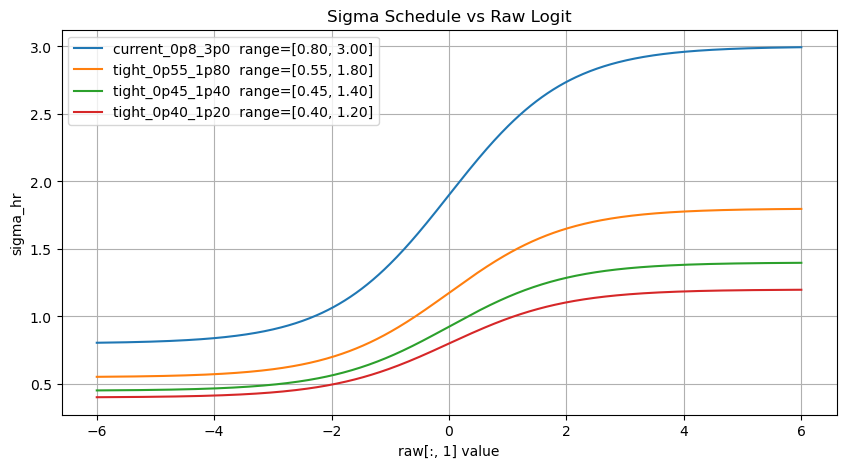

In [13]:
def sigmoid(x):
    return 1.0 / (1.0 + np.exp(-x))

# Schedule candidates: sigma = a + b * sigmoid(raw)
schedules = {
    'current_0p8_3p0': (0.8, 2.2),   # [0.8, 3.0]
    'tight_0p55_1p80': (0.55, 1.25), # [0.55, 1.80]
    'tight_0p45_1p40': (0.45, 0.95), # [0.45, 1.40]
    'tight_0p40_1p20': (0.40, 0.80), # [0.40, 1.20]
}

raw = np.linspace(-6.0, 6.0, 501)
fig, ax = plt.subplots()
for name, (a, b) in schedules.items():
    sigma = a + b * sigmoid(raw)
    ax.plot(raw, sigma, label=f'{name}  range=[{a:.2f}, {a+b:.2f}]')
ax.set_title('Sigma Schedule vs Raw Logit')
ax.set_xlabel('raw[:, 1] value')
ax.set_ylabel('sigma_hr')
ax.legend(loc='best')
plt.show()

In [14]:
# Inspect representative sigma and effective blur width (FWHM ~= 2.355 * sigma)
z_values = np.array([-4.0, -2.0, 0.0, 2.0, 4.0])
rows = []
for name, (a, b) in schedules.items():
    sig = a + b * sigmoid(z_values)
    for z, s in zip(z_values, sig):
        rows.append({
            'schedule': name,
            'raw_z': z,
            'sigma': float(s),
            'fwhm_px_est': float(2.355 * s),
        })
df = pd.DataFrame(rows)
display(df.pivot(index='raw_z', columns='schedule', values='sigma'))
display(df.pivot(index='raw_z', columns='schedule', values='fwhm_px_est'))

schedule,current_0p8_3p0,tight_0p40_1p20,tight_0p45_1p40,tight_0p55_1p80
raw_z,,,,
-4.0,0.839570,0.414389,0.467087,0.572483
-2.0,1.062246,0.495362,0.563243,0.699004
0.0,1.900000,0.800000,0.925000,1.175000
2.0,2.737754,1.104638,1.286757,1.650996
4.0,2.960430,1.185611,1.382913,1.777517


schedule,current_0p8_3p0,tight_0p40_1p20,tight_0p45_1p40,tight_0p55_1p80
raw_z,,,,
-4.0,1.977187,0.975886,1.099990,1.348197
-2.0,2.501590,1.166578,1.326437,1.646154
0.0,4.474500,1.884000,2.178375,2.767125
2.0,6.447410,2.601422,3.030313,3.888096
4.0,6.971813,2.792114,3.256760,4.186053


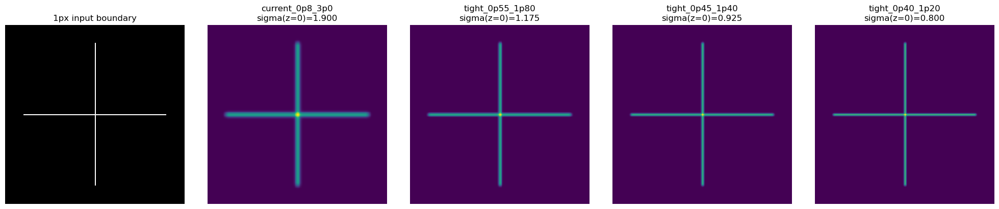

In [15]:
# Visual thickness comparison on a synthetic 1px boundary map
H, W = 196, 196
boundary = np.zeros((H, W), dtype=np.float32)
boundary[98, 20:176] = 1.0
boundary[20:176, 98] = 1.0

z_probe = 0.0  # compare at mid-logit operating point
fig, axes = plt.subplots(1, len(schedules) + 1, figsize=(4 * (len(schedules) + 1), 4))
axes[0].imshow(boundary, cmap='gray', vmin=0, vmax=1)
axes[0].set_title('1px input boundary')
axes[0].axis('off')

for i, (name, (a, b)) in enumerate(schedules.items(), start=1):
    sigma = float(a + b * sigmoid(z_probe))
    blurred = gaussian_filter(boundary, sigma=sigma, mode='nearest')
    blurred /= (blurred.max() + 1e-8)
    axes[i].imshow(blurred, cmap='viridis', vmin=0, vmax=1)
    axes[i].set_title(f'{name}\nsigma(z=0)={sigma:.3f}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()

In [16]:
# Patch helper: choose a schedule and print exact model-line replacement
chosen = 'tight_0p40_1p20'  # updated default from the real-sample scalar sweep
a, b = schedules[chosen]
print('Chosen schedule:', chosen)
print('Replace with:')
print(f"sigma_hr = {a:.2f} + {b:.2f} * torch.sigmoid(raw[:, 1:2])")

Chosen schedule: tight_0p40_1p20
Replace with:
sigma_hr = 0.40 + 0.80 * torch.sigmoid(raw[:, 1:2])


## Scalar-Pipeline Sigma Sweep On Real Model Outputs

This section runs the scalar branch exactly like the model (up to `boundary_prob_hr`), then re-applies the model's Gaussian blur stage with different sigma hyperparameters.

It also runs the exact geometric path used by the model for crisp boundaries:
- LR grains from quaternion misorientation connectivity,
- HR remap via learned `sdf_hr`,
- final 1px boundary from label transitions on remapped HR labels.

It answers: **if the same boundary probability map is held fixed, how does sigma change both blur thickness and exact remapped boundary geometry?**

In [17]:
from pathlib import Path
import os
import sys
import inspect
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F

# Make project-local imports work when notebook is opened from analysis/
REPO_ROOT = Path.cwd()
if not (REPO_ROOT / "inference").exists():
    REPO_ROOT = (Path.cwd() / "..").resolve()
if not (REPO_ROOT / "inference").exists():
    raise RuntimeError(f"Could not locate repo root from cwd={Path.cwd()}")
sys.path.insert(0, str(REPO_ROOT))

from inference.infer_iso_embedding_sr_attn import (
    _flatten_quat_chw,
    _load_model_from_checkpoint,
    _resolve_checkpoint,
    _resolve_model_class,
    _unpack_batch,
)
from training.config_utils import load_and_prepare_config
from training.data_loading import build_dataloader
from models.irrep_sdf_sr_one_sided_modified import build_irrep_boundary_evidence

EXP_DIR = REPO_ROOT / "experiments/IN718/irrep_sdf_sr_one_sided_modified_lean_norefine_01"
CONFIG_NAME = "config_new.json"
CHECKPOINT_NAME = "best_model.pt"
CASE_PRESETS = {
    "train_viz_val_sample0": {"split": "Val", "sample_idx": 0},
    "test_sample0": {"split": "Test", "sample_idx": 0},
}
CASE_NAME = "train_viz_val_sample0"
SELECTED_CASE = CASE_PRESETS[CASE_NAME]
SPLIT = str(SELECTED_CASE["split"])
SAMPLE_IDX = int(SELECTED_CASE["sample_idx"])

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Repo root:", REPO_ROOT)
print("Device:", DEVICE)
print("Selected case:", CASE_NAME, "->", {"split": SPLIT, "sample_idx": SAMPLE_IDX})


def resolve_loader_flags(cfg, model_cls):
    params = inspect.signature(model_cls.forward_sr).parameters
    model_supports_lr_boundary = "lr_boundary_map" in params
    model_requires_lr_boundary = (
        model_supports_lr_boundary
        and params["lr_boundary_map"].default is inspect._empty
    )
    feature_upsampler_type = str(getattr(cfg, "feature_upsampler_type", "shifted_bilinear")).strip().lower()
    use_lr_boundary_map = bool(getattr(cfg, "use_lr_boundary_map", model_supports_lr_boundary))
    if feature_upsampler_type == "grain_attention":
        use_lr_boundary_map = True
    if model_requires_lr_boundary:
        use_lr_boundary_map = True
    lr_boundary_angle_deg = float(getattr(cfg, "lr_boundary_angle_deg", 5.0))
    lr_boundary_mark_both_sides = bool(getattr(cfg, "lr_boundary_mark_both_sides", True))
    return use_lr_boundary_map, lr_boundary_angle_deg, lr_boundary_mark_both_sides


def safe_mean_std(x, eps=1e-8):
    mean = x.mean(dim=(-2, -1))
    var = ((x - mean[..., None, None]) ** 2).mean(dim=(-2, -1))
    std = torch.sqrt(var + eps)
    return mean, std


def run_scalar_to_boundary_prob(head, evidence_tensor_lr, lr_shape, extra_stats=None):
    H, W = lr_shape
    scale_y, scale_x = head.upsample_factor
    Hr, Wr = H * scale_y, W * scale_x

    x = evidence_tensor_lr
    if x.dim() == 3:
        x = x.unsqueeze(0)

    stem = head.lr_stem(x)
    guidance_lr = head.lr_guidance(stem)
    boundary_logits_lr = head.lr_boundary(stem)

    ev_mean, ev_std = safe_mean_std(x)
    st_mean, st_std = safe_mean_std(stem)
    pooled = torch.cat([ev_mean, ev_std, st_mean, st_std], dim=1)
    if extra_stats is not None:
        pooled = torch.cat([pooled, extra_stats], dim=1)

    raw = head.stats_mlp(pooled)
    sigma_pred = 0.8 + 2.2 * torch.sigmoid(raw[:, 1:2])

    guidance_up = F.interpolate(guidance_lr, size=(Hr, Wr), mode="bilinear", align_corners=False)
    boundary_up = F.interpolate(boundary_logits_lr, size=(Hr, Wr), mode="bilinear", align_corners=False)

    hr_hidden = head.hr_refine(torch.cat([guidance_up, torch.sigmoid(boundary_up)], dim=1))
    boundary_logits_hr = boundary_up + head.hr_boundary(hr_hidden)
    boundary_prob_hr = torch.sigmoid(boundary_logits_hr)

    return boundary_prob_hr, raw, sigma_pred


def blur_with_sigma(head, boundary_prob_hr, sigma):
    B = boundary_prob_hr.shape[0]
    if isinstance(sigma, (float, int)):
        sigma_t = torch.full((B, 1), float(sigma), device=boundary_prob_hr.device, dtype=boundary_prob_hr.dtype)
    elif isinstance(sigma, torch.Tensor):
        sigma_t = sigma.to(device=boundary_prob_hr.device, dtype=boundary_prob_hr.dtype).reshape(B, 1)
    else:
        raise TypeError(f"Unsupported sigma type: {type(sigma)}")

    sdf = head._gaussian_blur_per_batch(boundary_prob_hr, sigma_t)
    sdf = sdf / (sdf.amax(dim=(-2, -1), keepdim=True) + 1e-8)
    return sdf, sigma_t

Repo root: /data/home/umang/Materials/Reynolds-QSR_4x1
Device: cuda
Selected case: train_viz_val_sample0 -> {'split': 'Val', 'sample_idx': 0}


In [18]:
cfg = load_and_prepare_config(EXP_DIR / CONFIG_NAME, EXP_DIR / "logs" / "sigma_schedule_comparison_notebook_config.json")
checkpoint_path = _resolve_checkpoint(cfg, EXP_DIR, CHECKPOINT_NAME)
model = _load_model_from_checkpoint(cfg, checkpoint_path, device=DEVICE)
model.eval()

model_cls, _, _ = _resolve_model_class(cfg)
use_lr_boundary_map, lr_boundary_angle_deg, lr_boundary_mark_both_sides = resolve_loader_flags(cfg, model_cls)

loader = build_dataloader(
    dataset_root=cfg.dataset_root,
    split=SPLIT,
    batch_size=1,
    num_workers=0,
    preload=False,
    preload_torch=False,
    pin_memory=False,
    shuffle=False,
    take_first=SAMPLE_IDX + 1,
    seed=int(getattr(cfg, "seed", 42)),
    return_lr_boundary_map=use_lr_boundary_map,
    lr_boundary_angle_deg=lr_boundary_angle_deg,
    lr_boundary_mark_both_sides=lr_boundary_mark_both_sides,
)

selected_batch = None
for i, batch in enumerate(loader):
    if i == SAMPLE_IDX:
        selected_batch = batch
        break
if selected_batch is None:
    raise IndexError(f"sample_idx={SAMPLE_IDX} is out of range for split={SPLIT!r}")

lr_batch, hr_batch, lr_boundary_batch = _unpack_batch(selected_batch)
lr = lr_batch[0].to(device=DEVICE, dtype=torch.float32)
hr = hr_batch[0].to(device=DEVICE, dtype=torch.float32)
_ = hr  # not used in this sweep, kept for parity/context

lr_flat, lr_shape = _flatten_quat_chw(lr)

with torch.no_grad():
    feat_lr_a1 = model.encode_a1(lr_flat)
    feat = feat_lr_a1
    for blk in model.lr_blocks:
        feat = blk(feat, lr_shape)

    evidence = build_irrep_boundary_evidence(
        feat_lr=feat,
        lr_shape=lr_shape,
        irreps_feat=model.irreps_a1,
        offsets=model.evidence_offsets,
        radius=model.evidence_radius,
    )
    evidence_tensor = evidence["tensor"]

    boundary_prob_hr, raw_scalar, sigma_pred = run_scalar_to_boundary_prob(
        model.boundary_sdf_head,
        evidence_tensor,
        lr_shape,
    )

print("LR shape:", lr_shape)
print("Boundary prob shape:", tuple(boundary_prob_hr.shape))
print("Pred sigma (current schedule):", float(sigma_pred[0, 0].item()))
print("Raw scalar z used by schedule:", float(raw_scalar[0, 1].item()))

Using symmetry group from config: Oh
Overridden config values:
  - dataset_root: /data/home/umang/Materials/Materials_data_mount/datasets/IN718_QSR_4x1 (default: )
  - epochs: 300 (default: 10)
  - batch_size: 2 (default: 4)
  - lr: 0.003 (default: 0.0003)
  - scale: [4, 1] (default: 4)
  - symmetry_group: Oh (default: O)
  - decoder_num_starts: 8 (default: 2)
  - decoder_steps: 20 (default: 1)
  - decoder_lr: 0.03 (default: 0.05)
  - feature_upsampler_type: grain_attention (default: shifted_bilinear)
  - viz_every: 1 (default: 5)
  - num_workers: 8 (default: 0)
  - preload: True (default: False)
  - preload_torch: True (default: False)
  - min_free_cuda_gb: 4.0 (default: 0.0)
Using existing symmetry files for Oh
Saved resolved config to /data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/irrep_sdf_sr_one_sided_modified_lean_norefine_01/logs/sigma_schedule_comparison_notebook_config.json
Model: models.irrep_sdf_sr_one_sided_modified.IsoEmbeddingSRSDF
LR shape: (64, 256)
Bound

,name,kind,sigma_used,area@0.5,boundary_exact_px,boundary_exact_frac
1,const_0.45,constant,0.450000,0.086090,3256,0.049683
10,tight_0p40_1p20,schedule,0.546367,0.103653,3166,0.048309
2,const_0.60,constant,0.600000,0.110779,3146,0.048004
9,tight_0p45_1p40,schedule,0.623811,0.113617,3125,0.047684
8,tight_0p55_1p80,schedule,0.778699,0.124969,3088,0.047119
3,const_0.80,constant,0.800000,0.126205,3078,0.046967
4,const_1.00,constant,1.000000,0.138535,3019,0.046066
5,const_1.20,constant,1.200000,0.152237,2971,0.045334
0,default_pred_sigma,schedule,1.202509,0.152466,2970,0.045319
7,current_0p8_3p0,schedule,1.202509,0.152466,2970,0.045319


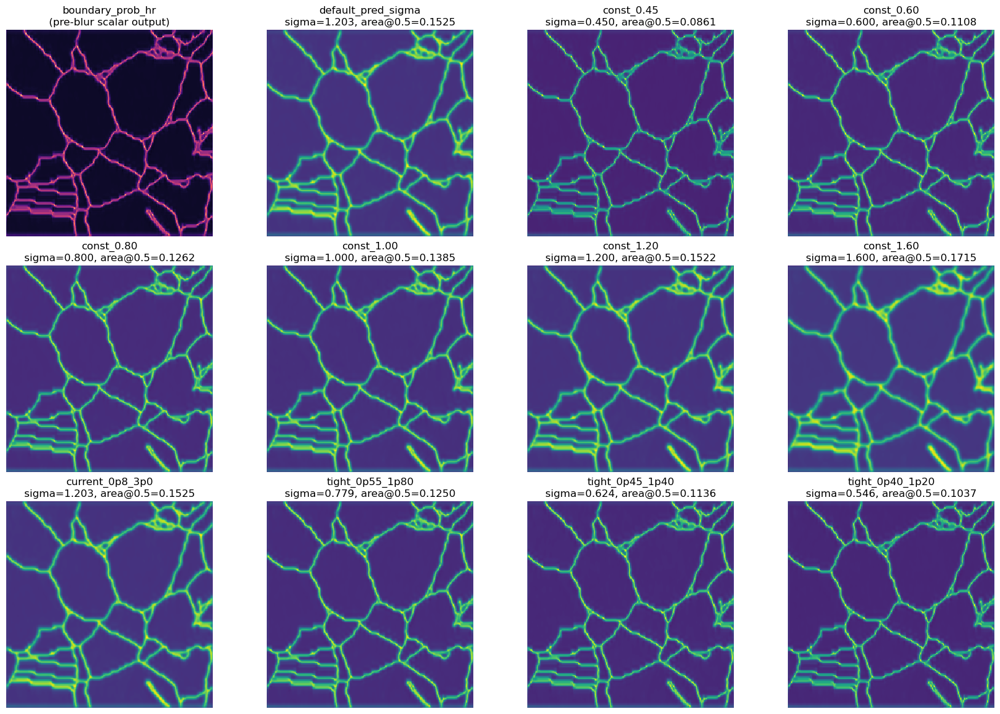

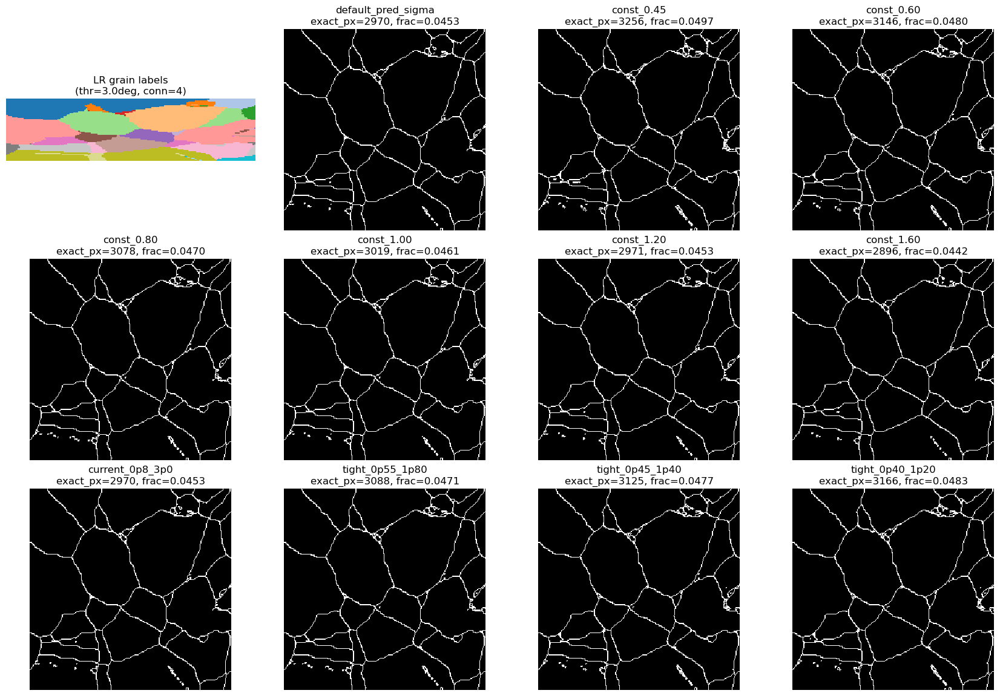

In [19]:
# Hyperparameter inputs: constants + alternate schedules
sigma_constants = [0.45, 0.60, 0.80, 1.00, 1.20, 1.60]

sigma_schedules = {
    "current_0p8_3p0": (0.8, 2.2),
    "tight_0p55_1p80": (0.55, 1.25),
    "tight_0p45_1p40": (0.45, 0.95),
    "tight_0p40_1p20": (0.40, 0.80),
}


def area_proxy(sdf_map, thr=0.5):
    # Larger area above threshold usually means thicker apparent boundary band.
    return float((sdf_map > thr).float().mean().item())


def exact_boundary_from_sdf(model, helper, labels_lr_dense_2d, sdf_hr_2d, connectivity):
    labels_hr = helper._remap_lr_labels_to_hr_via_sdf(labels_lr_dense_2d, sdf_hr_2d)
    boundary_exact = model._thin_boundary_from_labels_2d(labels_hr, connectivity=connectivity)
    return labels_hr, boundary_exact


connectivity = int(getattr(model, "boundary_connectivity", 8))
thr_deg = float(getattr(model, "boundary_thr_deg", 3.0))

with torch.no_grad():
    labels_lr_dense, _ = model.batch_boundary_teacher_from_quats(
        quats=lr_flat,
        img_shape=lr_shape,
        thr_deg=thr_deg,
        connectivity=connectivity,
    )
labels_lr_dense = labels_lr_dense.to(device=DEVICE, dtype=torch.long)

helper = model.grain_attention_helper
if helper is None:
    helper = model._make_boundary_prep_helper()

results = []
with torch.no_grad():
    sdf_default, sigma_default_t = blur_with_sigma(model.boundary_sdf_head, boundary_prob_hr, sigma_pred)
    results.append({
        "name": "default_pred_sigma",
        "kind": "schedule",
        "sigma_used": float(sigma_default_t[0, 0].item()),
        "sdf": sdf_default,
        "area@0.5": area_proxy(sdf_default[0, 0], thr=0.5),
    })

    for s in sigma_constants:
        sdf_const, sigma_t = blur_with_sigma(model.boundary_sdf_head, boundary_prob_hr, float(s))
        results.append({
            "name": f"const_{s:.2f}",
            "kind": "constant",
            "sigma_used": float(sigma_t[0, 0].item()),
            "sdf": sdf_const,
            "area@0.5": area_proxy(sdf_const[0, 0], thr=0.5),
        })

    z = raw_scalar[:, 1:2]
    for name, (a, b) in sigma_schedules.items():
        sigma_sched = float(a) + float(b) * torch.sigmoid(z)
        sdf_sched, sigma_t = blur_with_sigma(model.boundary_sdf_head, boundary_prob_hr, sigma_sched)
        results.append({
            "name": name,
            "kind": "schedule",
            "sigma_used": float(sigma_t[0, 0].item()),
            "sdf": sdf_sched,
            "area@0.5": area_proxy(sdf_sched[0, 0], thr=0.5),
        })

for item in results:
    labels_hr_i, boundary_exact_i = exact_boundary_from_sdf(
        model=model,
        helper=helper,
        labels_lr_dense_2d=labels_lr_dense[0],
        sdf_hr_2d=item["sdf"][0, 0],
        connectivity=connectivity,
    )
    item["labels_hr"] = labels_hr_i
    item["boundary_exact"] = boundary_exact_i
    item["boundary_exact_px"] = int(boundary_exact_i.sum().item())
    item["boundary_exact_frac"] = float(boundary_exact_i.float().mean().item())

summary_df = pd.DataFrame(
    [{k: v for k, v in item.items() if k not in {"sdf", "labels_hr", "boundary_exact"}} for item in results]
).sort_values("sigma_used")
display(summary_df)

# Visualization A: pre-blur scalar output and resulting SDF maps
n_panels = len(results) + 1
ncols = 4
nrows = int(np.ceil(n_panels / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 3.8 * nrows), constrained_layout=True)
axes = np.asarray(axes).reshape(-1)

axes[0].imshow(boundary_prob_hr[0, 0].detach().cpu().numpy(), cmap="magma", vmin=0.0, vmax=1.0)
axes[0].set_title("boundary_prob_hr\n(pre-blur scalar output)")
axes[0].axis("off")

for i, item in enumerate(results, start=1):
    sdf_np = item["sdf"][0, 0].detach().cpu().numpy()
    axes[i].imshow(sdf_np, cmap="viridis", vmin=0.0, vmax=1.0)
    axes[i].set_title(
        f"{item['name']}\n"
        f"sigma={item['sigma_used']:.3f}, area@0.5={item['area@0.5']:.4f}"
    )
    axes[i].axis("off")

for j in range(n_panels, len(axes)):
    axes[j].axis("off")

plt.show()

# Visualization B: exact boundary from label transitions after SDF-based remap
n_panels = len(results) + 1
ncols = 4
nrows = int(np.ceil(n_panels / ncols))
fig, axes = plt.subplots(nrows, ncols, figsize=(4.2 * ncols, 3.8 * nrows), constrained_layout=True)
axes = np.asarray(axes).reshape(-1)

axes[0].imshow(labels_lr_dense[0].detach().cpu().numpy(), cmap="tab20")
axes[0].set_title(f"LR grain labels\n(thr={thr_deg:.1f}deg, conn={connectivity})")
axes[0].axis("off")

for i, item in enumerate(results, start=1):
    bnd_np = item["boundary_exact"].detach().cpu().numpy().astype(np.float32)
    axes[i].imshow(bnd_np, cmap="gray", vmin=0.0, vmax=1.0)
    axes[i].set_title(
        f"{item['name']}\n"
        f"exact_px={item['boundary_exact_px']}, frac={item['boundary_exact_frac']:.4f}"
    )
    axes[i].axis("off")

for j in range(n_panels, len(axes)):
    axes[j].axis("off")

plt.show()

## Single-Experiment Upsampler Output Comparison Across Sigma

This section uses only the configured experiment:
`/data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/irrep_sdf_sr_one_sided_modified_lean_norefine_01`

It runs the model pipeline to the upsampler stage and compares **direct upsampler output** (`feat_shifted_mix_hr`) across different sigma values, while keeping the same LR input and model weights.

Experiment: /data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/irrep_sdf_sr_one_sided_modified_lean_norefine_01
Current upsampler mode: grain_attention


,mode,sigma,sdf_area@0.5,band_mean,feat_norm_mean,feat_delta_mean_vs_default,feat_delta_p95_vs_default
0,default,NaN,0.152466,0.884797,0.347805,0.000000,0.000000
1,override,0.45,0.086090,0.642046,0.255830,0.097412,0.143797
2,override,0.60,0.110779,0.741347,0.293445,0.058776,0.090461
3,override,0.80,0.126205,0.806983,0.318321,0.032487,0.051511
4,override,1.00,0.138535,0.850838,0.334969,0.014334,0.023012
5,override,1.20,0.152237,0.884484,0.347687,0.000140,0.000229
6,override,1.60,0.171539,0.923380,0.362272,0.017299,0.029359


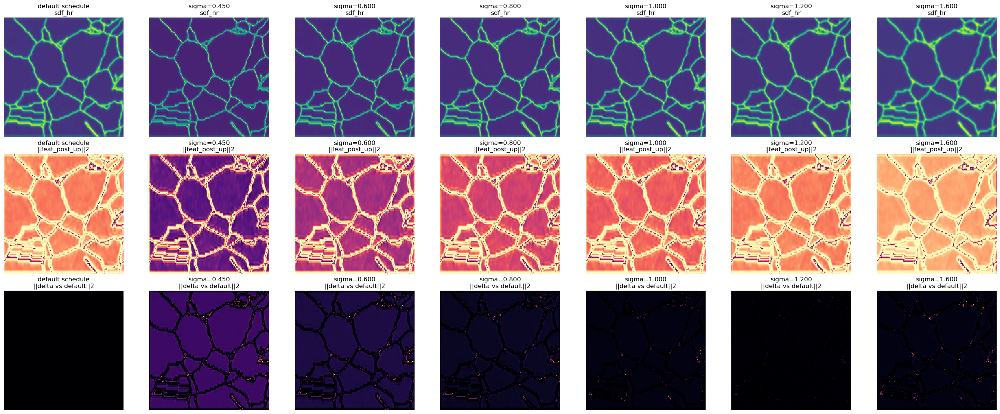

In [20]:
# Compare direct post-upsampler features for different sigma values
# using the true model forward_sr route with a temporary sigma override hook.
print("Experiment:", str(EXP_DIR))
print("Current upsampler mode:", getattr(model, "feature_upsampler_type", "unknown"))

from contextlib import contextmanager


def _flat_to_image_local(feat_flat, img_shape):
    H, W = img_shape
    if feat_flat.dim() == 2:
        feat_flat = feat_flat.unsqueeze(0)
    if feat_flat.dim() != 3:
        raise ValueError(f"Expected (B,N,C) or (N,C), got {tuple(feat_flat.shape)}")
    B, N, C = feat_flat.shape
    if N != H * W:
        raise ValueError(f"Flat N={N} does not match H*W={H*W} for img_shape={img_shape}")
    return feat_flat.transpose(1, 2).reshape(B, C, H, W).contiguous()


def _to_bchw_feature(feat_tensor, hr_shape):
    H, W = hr_shape
    if feat_tensor.dim() == 4:
        return feat_tensor
    if feat_tensor.dim() == 2:
        return _flat_to_image_local(feat_tensor, hr_shape)
    if feat_tensor.dim() == 3:
        # Either (B,N,C) flat or (C,H,W) image without batch.
        if feat_tensor.shape[1] == H * W:
            return _flat_to_image_local(feat_tensor, hr_shape)
        if feat_tensor.shape[-2:] == (H, W):
            return feat_tensor.unsqueeze(0)
    raise ValueError(f"Unsupported feature shape {tuple(feat_tensor.shape)} for hr_shape={hr_shape}")


def _to_b1hw(mask_tensor, hr_shape):
    H, W = hr_shape
    if mask_tensor.dim() == 4:
        return mask_tensor
    if mask_tensor.dim() == 3:
        if mask_tensor.shape[-2:] == (H, W):
            return mask_tensor.unsqueeze(0) if mask_tensor.shape[0] != 1 else mask_tensor
    if mask_tensor.dim() == 2:
        return mask_tensor.unsqueeze(0).unsqueeze(0)
    raise ValueError(f"Unsupported mask shape {tuple(mask_tensor.shape)} for hr_shape={hr_shape}")


@contextmanager
def sigma_override_hook(model_obj, sigma_value=None):
    """
    Override only sigma-driven sdf_hr/normals inside boundary_sdf_head while preserving
    the exact model forward_sr path for all other computations.
    """
    head = getattr(model_obj, "boundary_sdf_head", None)
    if head is None or sigma_value is None:
        yield
        return

    original_forward = head.forward

    def _forward_with_sigma(evidence_tensor_lr, lr_shape, extra_stats=None):
        out = original_forward(
            evidence_tensor_lr=evidence_tensor_lr,
            lr_shape=lr_shape,
            extra_stats=extra_stats,
        )

        boundary_prob_hr = out["boundary_prob_hr"]
        B = boundary_prob_hr.shape[0]
        sigma_t = torch.full(
            (B, 1),
            float(sigma_value),
            device=boundary_prob_hr.device,
            dtype=boundary_prob_hr.dtype,
        )

        sdf_hr = head._gaussian_blur_per_batch(boundary_prob_hr, sigma_t)
        sdf_hr = sdf_hr / (sdf_hr.amax(dim=(-2, -1), keepdim=True) + 1e-8)

        dy, dx = head._spatial_grad(sdf_hr)
        norm = torch.sqrt(dx * dx + dy * dy + 1e-8)
        nx_hr = dx / norm
        ny_hr = dy / norm

        out = dict(out)
        out["sdf_hr"] = sdf_hr
        out["nx_hr"] = nx_hr
        out["ny_hr"] = ny_hr
        out["sigma_hr"] = sigma_t
        return out

    head.forward = _forward_with_sigma
    try:
        yield
    finally:
        head.forward = original_forward


def run_forward_sr_with_sigma(model_obj, lr_quats_flat, lr_shape, sigma_value=None):
    with sigma_override_hook(model_obj, sigma_value=sigma_value):
        with torch.no_grad():
            q_hr, aux = model_obj.forward_sr(
                lr_quats_flat,
                lr_shape=lr_shape,
                normalize_input=True,
                return_aux=True,
            )

    required = ["feat_shifted_mix_hr", "boundary_band_hr", "sdf_hr", "hr_shape", "feat_hr_a1"]
    missing = [k for k in required if k not in aux]
    if missing:
        raise KeyError(f"forward_sr aux is missing required keys: {missing}")

    return q_hr.detach(), aux


with torch.no_grad():
    q_default, aux_default = run_forward_sr_with_sigma(
        model_obj=model,
        lr_quats_flat=lr_flat,
        lr_shape=lr_shape,
        sigma_value=None,
    )

hr_shape = tuple(int(v) for v in aux_default["hr_shape"])
feat_base = _to_bchw_feature(aux_default["feat_shifted_mix_hr"].detach(), hr_shape)

# Candidate sigma values for override runs. "default" uses model's learned schedule untouched.
sigma_candidates = [0.45, 0.60, 0.80, 1.00, 1.20, 1.60]
sigma_candidates = sorted(set(float(x) for x in sigma_candidates))

ups_out = [
    {
        "name": "default_schedule",
        "mode": "default",
        "sigma": None,
        "sdf_hr": aux_default["sdf_hr"].detach(),
        "feat_post_up": feat_base,
        "boundary_band_hr": _to_b1hw(aux_default["boundary_band_hr"].detach(), hr_shape),
    }
]

for s in sigma_candidates:
    with torch.no_grad():
        _, aux_s = run_forward_sr_with_sigma(
            model_obj=model,
            lr_quats_flat=lr_flat,
            lr_shape=lr_shape,
            sigma_value=s,
        )

    feat_post_s = _to_bchw_feature(aux_s["feat_shifted_mix_hr"].detach(), hr_shape)
    boundary_band_s = _to_b1hw(aux_s["boundary_band_hr"].detach(), hr_shape)

    ups_out.append(
        {
            "name": f"sigma_{s:.2f}",
            "mode": "override",
            "sigma": float(s),
            "sdf_hr": aux_s["sdf_hr"].detach(),
            "feat_post_up": feat_post_s,
            "boundary_band_hr": boundary_band_s,
        }
    )

summary_rows = []
for o in ups_out:
    feat = o["feat_post_up"]
    feat_norm = torch.linalg.vector_norm(feat, dim=1)
    feat_delta = torch.linalg.vector_norm(feat - feat_base, dim=1)

    summary_rows.append(
        {
            "mode": o["mode"],
            "sigma": np.nan if o["sigma"] is None else o["sigma"],
            "sdf_area@0.5": float((o["sdf_hr"][0, 0] > 0.5).float().mean().item()),
            "band_mean": float(o["boundary_band_hr"].mean().item()),
            "feat_norm_mean": float(feat_norm.mean().item()),
            "feat_delta_mean_vs_default": float(feat_delta.mean().item()),
            "feat_delta_p95_vs_default": float(torch.quantile(feat_delta.flatten(), 0.95).item()),
        }
    )

upsampler_sigma_summary_df = pd.DataFrame(summary_rows)
display(upsampler_sigma_summary_df)

# Visualization: Row1=sdf_hr, Row2=||feat_post_up||2, Row3=||delta vs default||2
ncols = len(ups_out)
fig, axes = plt.subplots(3, ncols, figsize=(3.9 * ncols, 11.0), constrained_layout=True)
axes = np.asarray(axes)
if axes.ndim == 1:
    axes = axes[:, None]

for ci, o in enumerate(ups_out):
    sdf_np = o["sdf_hr"][0, 0].detach().cpu().numpy()
    feat_norm_np = torch.linalg.vector_norm(o["feat_post_up"], dim=1)[0].detach().cpu().numpy()
    feat_delta_np = torch.linalg.vector_norm(o["feat_post_up"] - feat_base, dim=1)[0].detach().cpu().numpy()

    if o["mode"] == "default":
        title = "default schedule"
    else:
        title = f"sigma={o['sigma']:.3f}"

    axes[0, ci].imshow(sdf_np, cmap="viridis", vmin=0.0, vmax=1.0)
    axes[0, ci].set_title(f"{title}\nsdf_hr")
    axes[0, ci].axis("off")

    axes[1, ci].imshow(feat_norm_np, cmap="magma")
    axes[1, ci].set_title(f"{title}\n||feat_post_up||2")
    axes[1, ci].axis("off")

    axes[2, ci].imshow(feat_delta_np, cmap="inferno")
    axes[2, ci].set_title(f"{title}\n||delta vs default||2")
    axes[2, ci].axis("off")

plt.show()

## Fixed-Sigma Ablation (Direct Display, Saving)

This version runs the same 10-sample fixed-sigma ablation and renders results directly in the notebook. Save them

Saved high-res grid: /data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/irrep_sdf_sr_one_sided_modified_lean_norefine_01/analysis/sigma_modelroute_highres_grids/sample_000_ipf_sigma_highres.png


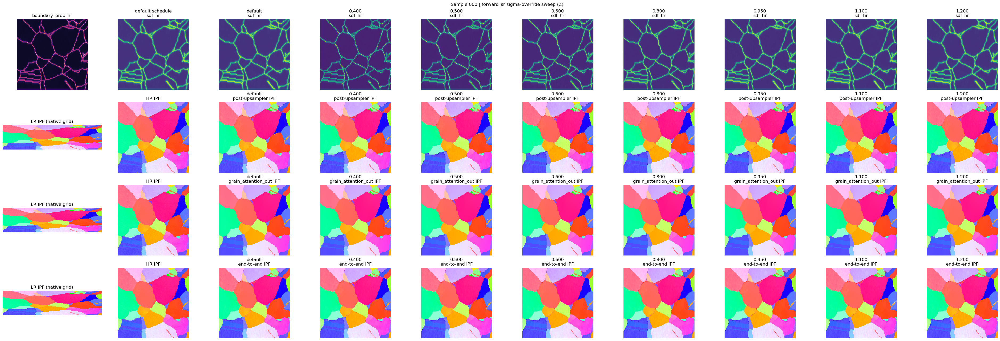

Saved high-res grid: /data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/irrep_sdf_sr_one_sided_modified_lean_norefine_01/analysis/sigma_modelroute_highres_grids/sample_001_ipf_sigma_highres.png


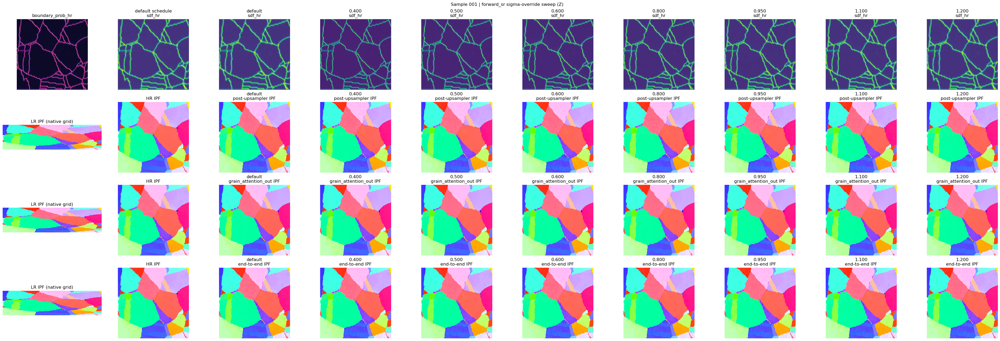

Saved high-res grid: /data/home/umang/Materials/Reynolds-QSR_4x1/experiments/IN718/irrep_sdf_sr_one_sided_modified_lean_norefine_01/analysis/sigma_modelroute_highres_grids/sample_002_ipf_sigma_highres.png


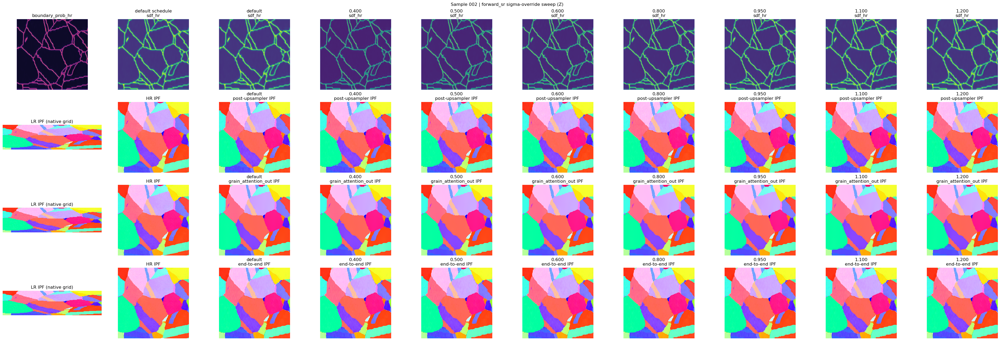

KeyboardInterrupt: 

In [21]:
from pathlib import Path
import sys
from contextlib import contextmanager
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch

# Make project-local imports robust when this cell is run directly.
REPO_ROOT = Path.cwd()
if not (REPO_ROOT / "inference").exists():
    REPO_ROOT = (Path.cwd() / "..").resolve()
if str(REPO_ROOT) not in sys.path:
    sys.path.insert(0, str(REPO_ROOT))

from utils.symmetry_utils import resolve_symmetry
from visualization.ipf_render import render_ipf_rgb
from utils.quat_ops import format_quaternions
from training.data_loading import build_dataloader
from inference.infer_iso_embedding_sr_attn import _flatten_quat_chw, _resolve_model_class, _unpack_batch


# No-save display settings
DISPLAY_NUM_SAMPLES = 10
DISPLAY_SIGMAS = [0.40, 0.50, 0.60, 0.80, 0.95, 1.10, 1.20]
DISPLAY_IPF_REF_DIR = "Z"
DISPLAY_SPLIT = SPLIT

# High-resolution save settings (kept optional)
DISPLAY_SAVE_HIGHRES = False
DISPLAY_SAVE_HIGHRES = True
DISPLAY_SAVE_DPI = 350
DISPLAY_TILE_INCH = 3.8
DISPLAY_OUT_DIR = EXP_DIR / "analysis" / "sigma_modelroute_highres_grids"
if DISPLAY_SAVE_HIGHRES:
    DISPLAY_OUT_DIR.mkdir(parents=True, exist_ok=True)

plt.rcParams["image.interpolation"] = "none"
plt.rcParams["image.resample"] = False
DISPLAY_PIXEL_ZOOM = 1


def _decode_feat_bchw_to_hwc_display(model_obj, feat_bchw: torch.Tensor) -> torch.Tensor:
    if feat_bchw.dim() != 4:
        raise ValueError(f"Expected BCHW feature tensor, got {tuple(feat_bchw.shape)}")
    B, C, H, W = feat_bchw.shape
    feat_flat = feat_bchw.permute(0, 2, 3, 1).reshape(B * H * W, C)
    with torch.enable_grad():
        q_flat = model_obj.decode(feat_flat)
    return q_flat.reshape(B, H, W, 4)


def _canonicalize_quat_hwc_display(q_hwc_np: np.ndarray, sym_class):
    return format_quaternions(
        q_hwc_np,
        normalize=True,
        hemisphere=True,
        reduce_fz=True,
        sym=sym_class,
        to_quat_first=False,
    )


def _flat_to_image_local(feat_flat, img_shape):
    H, W = img_shape
    if feat_flat.dim() == 2:
        feat_flat = feat_flat.unsqueeze(0)
    if feat_flat.dim() != 3:
        raise ValueError(f"Expected (B,N,C) or (N,C), got {tuple(feat_flat.shape)}")
    B, N, C = feat_flat.shape
    if N != H * W:
        raise ValueError(f"Flat N={N} does not match H*W={H*W} for img_shape={img_shape}")
    return feat_flat.transpose(1, 2).reshape(B, C, H, W).contiguous()


def _to_bchw_feature(feat_tensor, hr_shape):
    H, W = hr_shape
    if feat_tensor.dim() == 4:
        return feat_tensor
    if feat_tensor.dim() == 2:
        return _flat_to_image_local(feat_tensor, hr_shape)
    if feat_tensor.dim() == 3:
        if feat_tensor.shape[1] == H * W:
            return _flat_to_image_local(feat_tensor, hr_shape)
        if feat_tensor.shape[-2:] == (H, W):
            return feat_tensor.unsqueeze(0)
    raise ValueError(f"Unsupported feature shape {tuple(feat_tensor.shape)} for hr_shape={hr_shape}")


def _to_b1hw(mask_tensor, hr_shape):
    H, W = hr_shape
    if mask_tensor.dim() == 4:
        return mask_tensor
    if mask_tensor.dim() == 3 and mask_tensor.shape[-2:] == (H, W):
        return mask_tensor.unsqueeze(0) if mask_tensor.shape[0] != 1 else mask_tensor
    if mask_tensor.dim() == 2:
        return mask_tensor.unsqueeze(0).unsqueeze(0)
    raise ValueError(f"Unsupported mask shape {tuple(mask_tensor.shape)} for hr_shape={hr_shape}")


def _probe_stage_feat_bchw(aux, stage_name, hr_shape):
    for s in aux.get("probe_stages", []):
        if str(s.get("name", "")) == str(stage_name):
            feat = s.get("feat", None)
            if isinstance(feat, torch.Tensor):
                return _to_bchw_feature(feat.detach(), hr_shape)
    return None


def _pixel_block(img_np: np.ndarray, zoom: int = 1) -> np.ndarray:
    z = int(max(1, zoom))
    if z == 1:
        return img_np
    if img_np.ndim == 2:
        return np.repeat(np.repeat(img_np, z, axis=0), z, axis=1)
    if img_np.ndim == 3:
        return np.repeat(np.repeat(img_np, z, axis=0), z, axis=1)
    raise ValueError(f"Expected 2D or 3D image array, got shape={img_np.shape}")


@contextmanager
def sigma_override_hook(model_obj, sigma_value=None):
    head = getattr(model_obj, "boundary_sdf_head", None)
    if head is None or sigma_value is None:
        yield
        return

    original_forward = head.forward

    def _forward_with_sigma(evidence_tensor_lr, lr_shape, extra_stats=None):
        out = original_forward(
            evidence_tensor_lr=evidence_tensor_lr,
            lr_shape=lr_shape,
            extra_stats=extra_stats,
        )

        boundary_prob_hr = out["boundary_prob_hr"]
        B = boundary_prob_hr.shape[0]
        sigma_t = torch.full(
            (B, 1),
            float(sigma_value),
            device=boundary_prob_hr.device,
            dtype=boundary_prob_hr.dtype,
        )

        sdf_hr = head._gaussian_blur_per_batch(boundary_prob_hr, sigma_t)
        sdf_hr = sdf_hr / (sdf_hr.amax(dim=(-2, -1), keepdim=True) + 1e-8)

        dy, dx = head._spatial_grad(sdf_hr)
        norm = torch.sqrt(dx * dx + dy * dy + 1e-8)
        nx_hr = dx / norm
        ny_hr = dy / norm

        out = dict(out)
        out["sdf_hr"] = sdf_hr
        out["nx_hr"] = nx_hr
        out["ny_hr"] = ny_hr
        out["sigma_hr"] = sigma_t
        return out

    head.forward = _forward_with_sigma
    try:
        yield
    finally:
        head.forward = original_forward


def run_forward_sr_with_sigma(model_obj, lr_quats_flat, lr_shape, sigma_value=None):
    with sigma_override_hook(model_obj, sigma_value=sigma_value):
        with torch.no_grad():
            q_hr, aux = model_obj.forward_sr(
                lr_quats_flat,
                lr_shape=lr_shape,
                normalize_input=True,
                return_aux=True,
                return_probe=True,
            )

    required = ["feat_shifted_mix_hr", "boundary_band_hr", "sdf_hr", "hr_shape", "feat_hr_a1", "boundary_prob_hr"]
    missing = [k for k in required if k not in aux]
    if missing:
        raise KeyError(f"forward_sr aux is missing required keys: {missing}")

    return q_hr.detach(), aux


# Build a deterministic loader for first N samples.
model_cls, _, _ = _resolve_model_class(cfg)
use_lr_boundary_map, lr_boundary_angle_deg, lr_boundary_mark_both_sides = resolve_loader_flags(cfg, model_cls)

loader_display = build_dataloader(
    dataset_root=cfg.dataset_root,
    split=DISPLAY_SPLIT,
    batch_size=1,
    num_workers=0,
    preload=False,
    preload_torch=False,
    pin_memory=False,
    shuffle=False,
    take_first=DISPLAY_NUM_SAMPLES,
    seed=int(getattr(cfg, "seed", 42)),
    return_lr_boundary_map=use_lr_boundary_map,
    lr_boundary_angle_deg=lr_boundary_angle_deg,
    lr_boundary_mark_both_sides=lr_boundary_mark_both_sides,
)

sym_class_display = resolve_symmetry(getattr(cfg, "symmetry_group", "O"))
display_records = []

for sample_idx, batch in enumerate(loader_display):
    if sample_idx >= DISPLAY_NUM_SAMPLES:
        break

    lr_batch, hr_batch, _ = _unpack_batch(batch)
    lr = lr_batch[0].to(device=DEVICE, dtype=torch.float32)
    hr = hr_batch[0].to(device=DEVICE, dtype=torch.float32)
    lr_flat, lr_shape_i = _flatten_quat_chw(lr)

    # References
    lr_t = lr.detach().cpu()
    if lr_t.shape[0] == 4:
        lr_t = lr_t.permute(1, 2, 0)
    lr_hwc = _canonicalize_quat_hwc_display(lr_t.numpy().astype(np.float32), sym_class_display)

    hr_t = hr.detach().cpu()
    if hr_t.shape[0] == 4:
        hr_t = hr_t.permute(1, 2, 0)
    hr_hwc = _canonicalize_quat_hwc_display(hr_t.numpy().astype(np.float32), sym_class_display)

    lr_ipf = np.asarray(
        render_ipf_rgb(lr_hwc, sym_class_display, ref_dir=DISPLAY_IPF_REF_DIR),
        dtype=np.float32,
    )
    hr_ipf = np.asarray(
        render_ipf_rgb(hr_hwc, sym_class_display, ref_dir=DISPLAY_IPF_REF_DIR),
        dtype=np.float32,
    )

    # Default run: no sigma override, pure model schedule.
    with torch.no_grad():
        q_default_flat, aux_default = run_forward_sr_with_sigma(
            model_obj=model,
            lr_quats_flat=lr_flat,
            lr_shape=lr_shape_i,
            sigma_value=None,
        )

    hr_shape_i = tuple(int(v) for v in aux_default["hr_shape"])
    q_default_hwc = q_default_flat.reshape(hr_shape_i[0], hr_shape_i[1], 4).detach().cpu().numpy().astype(np.float32)
    q_default_hwc = _canonicalize_quat_hwc_display(q_default_hwc, sym_class_display)

    feat_post_default = _to_bchw_feature(aux_default["feat_shifted_mix_hr"].detach(), hr_shape_i)
    feat_e2e_default = _to_bchw_feature(aux_default["feat_hr_a1"].detach(), hr_shape_i)
    feat_grain_default_probe = _probe_stage_feat_bchw(aux_default, "grain_attention_out", hr_shape_i)
    grain_stage_present_default = feat_grain_default_probe is not None
    feat_grain_default = feat_grain_default_probe
    if feat_grain_default is None:
        feat_grain_default = _to_bchw_feature(
            aux_default.get("feat_center_hr", aux_default["feat_shifted_mix_hr"]).detach(),
            hr_shape_i,
        )

    q_post_default_hwc = _decode_feat_bchw_to_hwc_display(model, feat_post_default)[0].detach().cpu().numpy().astype(np.float32)
    q_post_default_hwc = _canonicalize_quat_hwc_display(q_post_default_hwc, sym_class_display)

    q_grain_default_hwc = _decode_feat_bchw_to_hwc_display(model, feat_grain_default)[0].detach().cpu().numpy().astype(np.float32)
    q_grain_default_hwc = _canonicalize_quat_hwc_display(q_grain_default_hwc, sym_class_display)

    ipf_post_default = np.asarray(render_ipf_rgb(q_post_default_hwc, sym_class_display, ref_dir=DISPLAY_IPF_REF_DIR), dtype=np.float32)
    ipf_grain_default = np.asarray(render_ipf_rgb(q_grain_default_hwc, sym_class_display, ref_dir=DISPLAY_IPF_REF_DIR), dtype=np.float32)
    ipf_e2e_default = np.asarray(render_ipf_rgb(q_default_hwc, sym_class_display, ref_dir=DISPLAY_IPF_REF_DIR), dtype=np.float32)

    outputs = [
        {
            "mode": "default",
            "sigma": np.nan,
            "sigma_label": "default",
            "sdf_hr": aux_default["sdf_hr"].detach(),
            "boundary_prob_hr": aux_default["boundary_prob_hr"].detach(),
            "boundary_band_hr": _to_b1hw(aux_default["boundary_band_hr"].detach(), hr_shape_i),
            "feat_post": feat_post_default,
            "feat_grain": feat_grain_default,
            "feat_e2e": feat_e2e_default,
            "ipf_post": ipf_post_default,
            "ipf_grain": ipf_grain_default,
            "ipf_e2e": ipf_e2e_default,
            "grain_stage_present": grain_stage_present_default,
        }
    ]

    sigma_candidates = sorted(set(float(s) for s in DISPLAY_SIGMAS))
    for sigma_val in sigma_candidates:
        with torch.no_grad():
            q_sigma_flat, aux_sigma = run_forward_sr_with_sigma(
                model_obj=model,
                lr_quats_flat=lr_flat,
                lr_shape=lr_shape_i,
                sigma_value=float(sigma_val),
            )

        q_sigma_hwc = q_sigma_flat.reshape(hr_shape_i[0], hr_shape_i[1], 4).detach().cpu().numpy().astype(np.float32)
        q_sigma_hwc = _canonicalize_quat_hwc_display(q_sigma_hwc, sym_class_display)

        feat_post_sigma = _to_bchw_feature(aux_sigma["feat_shifted_mix_hr"].detach(), hr_shape_i)
        feat_e2e_sigma = _to_bchw_feature(aux_sigma["feat_hr_a1"].detach(), hr_shape_i)
        feat_grain_sigma_probe = _probe_stage_feat_bchw(aux_sigma, "grain_attention_out", hr_shape_i)
        grain_stage_present_sigma = feat_grain_sigma_probe is not None
        feat_grain_sigma = feat_grain_sigma_probe
        if feat_grain_sigma is None:
            feat_grain_sigma = _to_bchw_feature(
                aux_sigma.get("feat_center_hr", aux_sigma["feat_shifted_mix_hr"]).detach(),
                hr_shape_i,
            )

        q_post_sigma_hwc = _decode_feat_bchw_to_hwc_display(model, feat_post_sigma)[0].detach().cpu().numpy().astype(np.float32)
        q_post_sigma_hwc = _canonicalize_quat_hwc_display(q_post_sigma_hwc, sym_class_display)

        q_grain_sigma_hwc = _decode_feat_bchw_to_hwc_display(model, feat_grain_sigma)[0].detach().cpu().numpy().astype(np.float32)
        q_grain_sigma_hwc = _canonicalize_quat_hwc_display(q_grain_sigma_hwc, sym_class_display)

        ipf_post_sigma = np.asarray(render_ipf_rgb(q_post_sigma_hwc, sym_class_display, ref_dir=DISPLAY_IPF_REF_DIR), dtype=np.float32)
        ipf_grain_sigma = np.asarray(render_ipf_rgb(q_grain_sigma_hwc, sym_class_display, ref_dir=DISPLAY_IPF_REF_DIR), dtype=np.float32)
        ipf_e2e_sigma = np.asarray(render_ipf_rgb(q_sigma_hwc, sym_class_display, ref_dir=DISPLAY_IPF_REF_DIR), dtype=np.float32)

        outputs.append(
            {
                "mode": "override",
                "sigma": float(sigma_val),
                "sigma_label": f"{float(sigma_val):.3f}",
                "sdf_hr": aux_sigma["sdf_hr"].detach(),
                "boundary_prob_hr": aux_sigma["boundary_prob_hr"].detach(),
                "boundary_band_hr": _to_b1hw(aux_sigma["boundary_band_hr"].detach(), hr_shape_i),
                "feat_post": feat_post_sigma,
                "feat_grain": feat_grain_sigma,
                "feat_e2e": feat_e2e_sigma,
                "ipf_post": ipf_post_sigma,
                "ipf_grain": ipf_grain_sigma,
                "ipf_e2e": ipf_e2e_sigma,
                "grain_stage_present": grain_stage_present_sigma,
            }
        )

    for out in outputs:
        feat_post_norm = torch.linalg.vector_norm(out["feat_post"], dim=1)
        feat_e2e_norm = torch.linalg.vector_norm(out["feat_e2e"], dim=1)
        feat_delta = torch.linalg.vector_norm(out["feat_e2e"] - out["feat_post"], dim=1)

        display_records.append(
            {
                "sample_idx": int(sample_idx),
                "mode": out["mode"],
                "sigma": out["sigma"],
                "sigma_label": out["sigma_label"],
                "sdf_area@0.5": float((out["sdf_hr"][0, 0] > 0.5).float().mean().item()),
                "band_mean": float(out["boundary_band_hr"].mean().item()),
                "feat_post_norm_mean": float(feat_post_norm.mean().item()),
                "feat_e2e_norm_mean": float(feat_e2e_norm.mean().item()),
                "feat_e2e_minus_post_mean": float(feat_delta.mean().item()),
            }
        )

    ncols = 2 + len(outputs)
    fig, axes = plt.subplots(
        4,
        ncols,
        figsize=(DISPLAY_TILE_INCH * ncols, DISPLAY_TILE_INCH * 3.35),
        constrained_layout=True,
    )
    axes = np.asarray(axes)

    axes[0, 0].imshow(
        _pixel_block(outputs[0]["boundary_prob_hr"][0, 0].detach().cpu().numpy(), DISPLAY_PIXEL_ZOOM),
        cmap="magma",
        vmin=0.0,
        vmax=1.0,
        interpolation="nearest",
        resample=False,
    )
    axes[0, 0].set_title("boundary_prob_hr")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(
        _pixel_block(outputs[0]["sdf_hr"][0, 0].detach().cpu().numpy(), DISPLAY_PIXEL_ZOOM),
        cmap="viridis",
        vmin=0.0,
        vmax=1.0,
        interpolation="nearest",
        resample=False,
    )
    axes[0, 1].set_title("default schedule\nsdf_hr")
    axes[0, 1].axis("off")

    axes[1, 0].imshow(_pixel_block(lr_ipf, DISPLAY_PIXEL_ZOOM), interpolation="nearest", resample=False)
    axes[1, 0].set_title("LR IPF (native grid)")
    axes[1, 0].axis("off")

    axes[1, 1].imshow(_pixel_block(hr_ipf, DISPLAY_PIXEL_ZOOM), interpolation="nearest", resample=False)
    axes[1, 1].set_title("HR IPF")
    axes[1, 1].axis("off")

    axes[2, 0].imshow(_pixel_block(lr_ipf, DISPLAY_PIXEL_ZOOM), interpolation="nearest", resample=False)
    axes[2, 0].set_title("LR IPF (native grid)")
    axes[2, 0].axis("off")

    axes[2, 1].imshow(_pixel_block(hr_ipf, DISPLAY_PIXEL_ZOOM), interpolation="nearest", resample=False)
    axes[2, 1].set_title("HR IPF")
    axes[2, 1].axis("off")

    axes[3, 0].imshow(_pixel_block(lr_ipf, DISPLAY_PIXEL_ZOOM), interpolation="nearest", resample=False)
    axes[3, 0].set_title("LR IPF (native grid)")
    axes[3, 0].axis("off")

    axes[3, 1].imshow(_pixel_block(hr_ipf, DISPLAY_PIXEL_ZOOM), interpolation="nearest", resample=False)
    axes[3, 1].set_title("HR IPF")
    axes[3, 1].axis("off")

    for ci, out in enumerate(outputs, start=2):
        label = out["sigma_label"]

        axes[0, ci].imshow(
            _pixel_block(out["sdf_hr"][0, 0].detach().cpu().numpy(), DISPLAY_PIXEL_ZOOM),
            cmap="viridis",
            vmin=0.0,
            vmax=1.0,
            interpolation="nearest",
            resample=False,
        )
        axes[0, ci].set_title(f"{label}\nsdf_hr")
        axes[0, ci].axis("off")

        axes[1, ci].imshow(_pixel_block(out["ipf_post"], DISPLAY_PIXEL_ZOOM), interpolation="nearest", resample=False)
        axes[1, ci].set_title(f"{label}\npost-upsampler IPF")
        axes[1, ci].axis("off")

        grain_title = "grain_attention_out IPF" if out["grain_stage_present"] else "grain_attention_out IPF (fallback)"
        axes[2, ci].imshow(_pixel_block(out["ipf_grain"], DISPLAY_PIXEL_ZOOM), interpolation="nearest", resample=False)
        axes[2, ci].set_title(f"{label}\n{grain_title}")
        axes[2, ci].axis("off")

        axes[3, ci].imshow(_pixel_block(out["ipf_e2e"], DISPLAY_PIXEL_ZOOM), interpolation="nearest", resample=False)
        axes[3, ci].set_title(f"{label}\nend-to-end IPF")
        axes[3, ci].axis("off")

    fig.suptitle(
        f"Sample {sample_idx:03d} | forward_sr sigma-override sweep ({DISPLAY_IPF_REF_DIR})",
        fontsize=12,
    )

    if DISPLAY_SAVE_HIGHRES:
        out_png = DISPLAY_OUT_DIR / f"sample_{sample_idx:03d}_ipf_sigma_highres.png"
        fig.savefig(out_png, dpi=DISPLAY_SAVE_DPI, bbox_inches="tight", pad_inches=0.02)
        print("Saved high-res grid:", out_png)

    plt.show()

summary_direct_df = pd.DataFrame(display_records).sort_values(["sample_idx", "mode", "sigma_label"])
display(summary_direct_df.head(20))

display(
    summary_direct_df.groupby(["mode", "sigma_label"])[
        ["sdf_area@0.5", "band_mean", "feat_post_norm_mean", "feat_e2e_norm_mean", "feat_e2e_minus_post_mean"]
    ]
    .agg(["mean", "std", "min", "max"])
)

print("Direct display complete.")
print("Records:", len(summary_direct_df))
print("Samples:", summary_direct_df["sample_idx"].nunique())
if DISPLAY_SAVE_HIGHRES:
    print("Saved high-res grids to:", DISPLAY_OUT_DIR)
else:
    print("High-res save disabled (DISPLAY_SAVE_HIGHRES=False).")
print("Default row uses the model's learned sigma schedule with no override.")

## Stage Audit: Where `sdf_hr` Finalizes and Where HR Boundaries Become Fixed

This section probes the exact model path and saves plots for async review.

What it verifies:
1. `sdf_hr` is finalized immediately after Gaussian blur + normalization of `boundary_prob_hr`.
2. HR boundaries used by grain-aware routing are fixed from learned-SDF remap (`boundary_hr_1px`).
3. The "directly-after-upsampler" row is a true no-mix/no-pooling bilinear sample from LR features.

Saved outputs are written under the experiment analysis folder.

In [ ]:
from datetime import datetime
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import torch

from models.irrep_sdf_sr_one_sided_modified import (
    _flat_to_image as _flat_to_image_model,
    _build_hr_base_coords as _build_hr_base_coords_model,
    _sample_feat_lr as _sample_feat_lr_model,
)
from training.data_loading import build_dataloader
from inference.infer_iso_embedding_sr_attn import _flatten_quat_chw, _resolve_model_class, _unpack_batch


AUDIT_SAMPLE_IDX = 0
AUDIT_SIGMAS = [0.40, 0.50, 0.60, 0.80, 0.95, 1.10, 1.20]
AUDIT_SPLIT = SPLIT
AUDIT_SAVE = True
AUDIT_DPI = 260
AUDIT_TILE_INCH = 3.6
AUDIT_PIXEL_ZOOM = 1

stamp = datetime.now().strftime("%Y%m%d_%H%M%S")
AUDIT_OUT_DIR = EXP_DIR / "analysis" / f"sigma_stage_audit_async_{stamp}"
if AUDIT_SAVE:
    AUDIT_OUT_DIR.mkdir(parents=True, exist_ok=True)


def _pixel_block(img_np: np.ndarray, zoom: int = 1) -> np.ndarray:
    z = int(max(1, zoom))
    if z == 1:
        return img_np
    if img_np.ndim in (2, 3):
        return np.repeat(np.repeat(img_np, z, axis=0), z, axis=1)
    raise ValueError(f"Expected 2D/3D image, got shape={img_np.shape}")


def _to_bchw_feature_local(feat_tensor, hr_shape):
    H, W = hr_shape
    if feat_tensor.dim() == 4:
        return feat_tensor
    if feat_tensor.dim() == 2:
        feat_tensor = feat_tensor.unsqueeze(0)
    if feat_tensor.dim() == 3:
        if feat_tensor.shape[1] == H * W:
            return feat_tensor.transpose(1, 2).reshape(feat_tensor.shape[0], feat_tensor.shape[2], H, W).contiguous()
        if feat_tensor.shape[-2:] == (H, W):
            return feat_tensor.unsqueeze(0)
    raise ValueError(f"Unsupported feature shape {tuple(feat_tensor.shape)} for hr_shape={hr_shape}")


def _to_b1hw_local(mask_tensor, hr_shape):
    H, W = hr_shape
    if mask_tensor.dim() == 4:
        return mask_tensor
    if mask_tensor.dim() == 3:
        if mask_tensor.shape[1] == H and mask_tensor.shape[2] == W:
            return mask_tensor.unsqueeze(1)
        if mask_tensor.shape[1] == H * W:
            return mask_tensor.reshape(mask_tensor.shape[0], 1, H, W)
    if mask_tensor.dim() == 2:
        if mask_tensor.shape == (H, W):
            return mask_tensor.unsqueeze(0).unsqueeze(0)
        if mask_tensor.shape[1] == H * W:
            return mask_tensor.reshape(mask_tensor.shape[0], 1, H, W)
    if mask_tensor.dim() == 1 and int(mask_tensor.numel()) == H * W:
        return mask_tensor.reshape(1, 1, H, W)
    raise ValueError(f"Unsupported mask shape {tuple(mask_tensor.shape)} for hr_shape={hr_shape}")


def _probe_stage_feat_bchw(aux, stage_name, hr_shape):
    for s in aux.get("probe_stages", []):
        if str(s.get("name", "")) == str(stage_name):
            feat = s.get("feat", None)
            if isinstance(feat, torch.Tensor):
                return _to_bchw_feature_local(feat.detach(), hr_shape)
    return None


def _run_forward_sr_with_sigma_and_probe(model_obj, lr_quats_flat, lr_shape, sigma_value=None):
    with sigma_override_hook(model_obj, sigma_value=sigma_value):
        with torch.no_grad():
            q_hr, aux = model_obj.forward_sr(
                lr_quats_flat,
                lr_shape=lr_shape,
                normalize_input=True,
                return_aux=True,
                return_probe=True,
            )
    required = [
        "boundary_prob_hr",
        "sdf_hr",
        "boundary_band_hr",
        "feat_center_hr",
        "feat_shifted_mix_hr",
        "feat_hr_a1",
        "feat_lr_a1_post_lr",
        "hr_shape",
    ]
    missing = [k for k in required if k not in aux]
    if missing:
        raise KeyError(f"forward_sr aux missing keys: {missing}")
    return q_hr.detach(), aux


def _compute_direct_bilinear_stage(aux, lr_shape):
    H_lr, W_lr = lr_shape
    feat_lr_post = aux["feat_lr_a1_post_lr"].detach()
    feat_lr_img = _flat_to_image_model(feat_lr_post, (H_lr, W_lr))
    if feat_lr_img.dim() == 3:
        feat_lr_img = feat_lr_img.unsqueeze(0)

    B = feat_lr_img.shape[0]
    y_base, x_base = _build_hr_base_coords_model(
        H_lr,
        W_lr,
        model.upsample_factor,
        feat_lr_img.device,
        feat_lr_img.dtype,
    )
    y_base = y_base[None].expand(B, -1, -1)
    x_base = x_base[None].expand(B, -1, -1)
    feat_bilinear = _sample_feat_lr_model(feat_lr_img, y_base, x_base)
    return feat_bilinear


# Deterministic loader for the selected sample.
model_cls, _, _ = _resolve_model_class(cfg)
use_lr_boundary_map, lr_boundary_angle_deg, lr_boundary_mark_both_sides = resolve_loader_flags(cfg, model_cls)
loader_audit = build_dataloader(
    dataset_root=cfg.dataset_root,
    split=AUDIT_SPLIT,
    batch_size=1,
    num_workers=0,
    preload=False,
    preload_torch=False,
    pin_memory=False,
    shuffle=False,
    take_first=AUDIT_SAMPLE_IDX + 1,
    seed=int(getattr(cfg, "seed", 42)),
    return_lr_boundary_map=use_lr_boundary_map,
    lr_boundary_angle_deg=lr_boundary_angle_deg,
    lr_boundary_mark_both_sides=lr_boundary_mark_both_sides,
)

batch_audit = None
for i, batch in enumerate(loader_audit):
    if i == AUDIT_SAMPLE_IDX:
        batch_audit = batch
        break
if batch_audit is None:
    raise IndexError(f"AUDIT_SAMPLE_IDX={AUDIT_SAMPLE_IDX} out of range for split={AUDIT_SPLIT!r}")

lr_batch, _, _ = _unpack_batch(batch_audit)
lr = lr_batch[0].to(device=DEVICE, dtype=torch.float32)
lr_flat, lr_shape_audit = _flatten_quat_chw(lr)

runs = [("default_schedule", None)] + [(f"sigma_{s:.3f}", float(s)) for s in sorted(set(float(x) for x in AUDIT_SIGMAS))]
audit_rows = []

for run_name, sigma_value in runs:
    with torch.no_grad():
        _, aux_run = _run_forward_sr_with_sigma_and_probe(
            model_obj=model,
            lr_quats_flat=lr_flat,
            lr_shape=lr_shape_audit,
            sigma_value=sigma_value,
        )

    hr_shape = tuple(int(v) for v in aux_run["hr_shape"])

    # Directly-after-upsampler no-mix/no-pooling baseline.
    feat_bilinear_direct = _compute_direct_bilinear_stage(aux_run, lr_shape_audit)

    # Exposed model stages.
    feat_grain_attn_hr = _probe_stage_feat_bchw(aux_run, "grain_attention_out", hr_shape)
    feat_center_hr = _to_bchw_feature_local(aux_run["feat_center_hr"].detach(), hr_shape)
    feat_shifted_mix_hr = _to_bchw_feature_local(aux_run["feat_shifted_mix_hr"].detach(), hr_shape)
    feat_hr_a1 = _to_bchw_feature_local(aux_run["feat_hr_a1"].detach(), hr_shape)

    grain_stage_present = feat_grain_attn_hr is not None
    if feat_grain_attn_hr is None:
        # Non-grain-attention runs may not expose this stage.
        feat_grain_attn_hr = feat_center_hr.clone()

    # Scalar path around final SDF and boundary fix.
    boundary_prob_hr = aux_run["boundary_prob_hr"].detach()
    sdf_hr = aux_run["sdf_hr"].detach()
    boundary_band_hr = _to_b1hw_local(aux_run["boundary_band_hr"].detach(), hr_shape)
    boundary_hr_1px = aux_run.get("boundary_hr_1px", None)

    # Probe-stage order confirms when upsample and HR blocks happen.
    probe_names = [str(s["name"]) for s in aux_run.get("probe_stages", [])]

    delta_center_vs_bilinear = torch.linalg.vector_norm(feat_center_hr - feat_bilinear_direct, dim=1)
    delta_center_vs_grain = torch.linalg.vector_norm(feat_center_hr - feat_grain_attn_hr, dim=1)
    delta_mix_vs_center = torch.linalg.vector_norm(feat_shifted_mix_hr - feat_center_hr, dim=1)
    delta_final_vs_mix = torch.linalg.vector_norm(feat_hr_a1 - feat_shifted_mix_hr, dim=1)

    center_valid = aux_run.get("center_valid_hr", None)
    center_valid_frac = float(center_valid.float().mean().item()) if center_valid is not None else np.nan

    audit_rows.append(
        {
            "run": run_name,
            "sigma": np.nan if sigma_value is None else float(sigma_value),
            "grain_stage_present": bool(grain_stage_present),
            "sdf_area@0.5": float((sdf_hr[0, 0] > 0.5).float().mean().item()),
            "band_mean": float(boundary_band_hr.mean().item()),
            "center_valid_frac": center_valid_frac,
            "delta_center_vs_bilinear_mean": float(delta_center_vs_bilinear.mean().item()),
            "delta_center_vs_grain_mean": float(delta_center_vs_grain.mean().item()),
            "delta_mix_vs_center_mean": float(delta_mix_vs_center.mean().item()),
            "delta_final_vs_mix_mean": float(delta_final_vs_mix.mean().item()),
            "probe_has_grain_attention_out": ("grain_attention_out" in probe_names),
            "probe_has_upsample_shifted_mix_hr": ("upsample_shifted_mix_hr" in probe_names),
            "probe_has_hr_block_1": any(n.startswith("hr_block_") for n in probe_names),
        }
    )

    # Figure:
    #   Row 1 = scalar finalization path
    #   Row 2 = grain-attention aware feature lineage (includes grain_attention_out)
    #   Row 3 = bilinear baseline + deltas
    fig, axes = plt.subplots(3, 4, figsize=(AUDIT_TILE_INCH * 4, AUDIT_TILE_INCH * 3.35), constrained_layout=True)
    axes = np.asarray(axes)

    axes[0, 0].imshow(
        _pixel_block(boundary_prob_hr[0, 0].detach().cpu().numpy(), AUDIT_PIXEL_ZOOM),
        cmap="magma",
        vmin=0.0,
        vmax=1.0,
        interpolation="nearest",
        resample=False,
    )
    axes[0, 0].set_title("boundary_prob_hr\n(pre-blur)")
    axes[0, 0].axis("off")

    axes[0, 1].imshow(
        _pixel_block(sdf_hr[0, 0].detach().cpu().numpy(), AUDIT_PIXEL_ZOOM),
        cmap="viridis",
        vmin=0.0,
        vmax=1.0,
        interpolation="nearest",
        resample=False,
    )
    axes[0, 1].set_title("sdf_hr\n(post-gaussian+norm)")
    axes[0, 1].axis("off")

    if boundary_hr_1px is not None:
        axes[0, 2].imshow(
            _pixel_block(boundary_hr_1px[0, 0].detach().cpu().numpy(), AUDIT_PIXEL_ZOOM),
            cmap="gray",
            vmin=0.0,
            vmax=1.0,
            interpolation="nearest",
            resample=False,
        )
        axes[0, 2].set_title("boundary_hr_1px\n(fixed from learned-SDF remap)")
    else:
        axes[0, 2].imshow(np.zeros_like(sdf_hr[0, 0].detach().cpu().numpy()), cmap="gray", vmin=0.0, vmax=1.0)
        axes[0, 2].set_title("boundary_hr_1px\n(not present in aux)")
    axes[0, 2].axis("off")

    axes[0, 3].imshow(
        _pixel_block(boundary_band_hr[0, 0].detach().cpu().numpy(), AUDIT_PIXEL_ZOOM),
        cmap="cividis",
        vmin=0.0,
        vmax=1.0,
        interpolation="nearest",
        resample=False,
    )
    axes[0, 3].set_title("boundary_band_hr\n(mask driving side mix)")
    axes[0, 3].axis("off")

    grain_norm = torch.linalg.vector_norm(feat_grain_attn_hr, dim=1)[0].detach().cpu().numpy()
    ctr_norm = torch.linalg.vector_norm(feat_center_hr, dim=1)[0].detach().cpu().numpy()
    mix_norm = torch.linalg.vector_norm(feat_shifted_mix_hr, dim=1)[0].detach().cpu().numpy()
    fin_norm = torch.linalg.vector_norm(feat_hr_a1, dim=1)[0].detach().cpu().numpy()

    axes[1, 0].imshow(_pixel_block(grain_norm, AUDIT_PIXEL_ZOOM), cmap="magma", interpolation="nearest", resample=False)
    if grain_stage_present:
        axes[1, 0].set_title("grain_attention_out\n(row added)")
    else:
        axes[1, 0].set_title("grain_attention_out\n(fallback to center)")
    axes[1, 0].axis("off")

    axes[1, 1].imshow(_pixel_block(ctr_norm, AUDIT_PIXEL_ZOOM), cmap="magma", interpolation="nearest", resample=False)
    axes[1, 1].set_title("feat_center_hr\n(model center stage)")
    axes[1, 1].axis("off")

    axes[1, 2].imshow(_pixel_block(mix_norm, AUDIT_PIXEL_ZOOM), cmap="magma", interpolation="nearest", resample=False)
    axes[1, 2].set_title("feat_shifted_mix_hr\n(after +/- side mix)")
    axes[1, 2].axis("off")

    axes[1, 3].imshow(_pixel_block(fin_norm, AUDIT_PIXEL_ZOOM), cmap="magma", interpolation="nearest", resample=False)
    axes[1, 3].set_title("feat_hr_a1\n(after HR blocks/refine)")
    axes[1, 3].axis("off")

    bil_norm = torch.linalg.vector_norm(feat_bilinear_direct, dim=1)[0].detach().cpu().numpy()
    d_cg = delta_center_vs_grain[0].detach().cpu().numpy()
    d_mc = delta_mix_vs_center[0].detach().cpu().numpy()
    d_fm = delta_final_vs_mix[0].detach().cpu().numpy()

    axes[2, 0].imshow(_pixel_block(bil_norm, AUDIT_PIXEL_ZOOM), cmap="magma", interpolation="nearest", resample=False)
    axes[2, 0].set_title("direct bilinear center\n(no pooling, no +/- mix)")
    axes[2, 0].axis("off")

    axes[2, 1].imshow(_pixel_block(d_cg, AUDIT_PIXEL_ZOOM), cmap="inferno", interpolation="nearest", resample=False)
    axes[2, 1].set_title("||center - grain_attn||2")
    axes[2, 1].axis("off")

    axes[2, 2].imshow(_pixel_block(d_mc, AUDIT_PIXEL_ZOOM), cmap="inferno", interpolation="nearest", resample=False)
    axes[2, 2].set_title("||mix - center||2")
    axes[2, 2].axis("off")

    axes[2, 3].imshow(_pixel_block(d_fm, AUDIT_PIXEL_ZOOM), cmap="inferno", interpolation="nearest", resample=False)
    axes[2, 3].set_title("||final - mix||2")
    axes[2, 3].axis("off")

    fig.suptitle(
        f"Stage audit | sample={AUDIT_SAMPLE_IDX} | run={run_name} | "
        f"d(center-grain)={float(delta_center_vs_grain.mean().item()):.4e}, "
        f"d(mix-center)={float(delta_mix_vs_center.mean().item()):.4e}, "
        f"d(final-mix)={float(delta_final_vs_mix.mean().item()):.4e}",
        fontsize=11,
    )

    if AUDIT_SAVE:
        out_png = AUDIT_OUT_DIR / f"sample_{AUDIT_SAMPLE_IDX:03d}_{run_name}_stage_audit.png"
        fig.savefig(out_png, dpi=AUDIT_DPI, bbox_inches="tight", pad_inches=0.02)

    plt.show()


audit_df = pd.DataFrame(audit_rows)
display(audit_df)

print("Stage-order reference from model path:")
print("1) boundary_prob_hr -> 2) gaussian blur + normalize => sdf_hr -> 3) learned-SDF remap => boundary_hr_1px (if grain-attention context is active)")
print("4) grain_attention_out -> 5) upsample center/+/− side selection + boundary-band mix => feat_shifted_mix_hr -> 6) HR blocks/refine => feat_hr_a1")
print("Saved stage-audit plots:", AUDIT_OUT_DIR)
print("Rows rendered:", len(audit_df))